<div align="center">

  <a href="https://ultralytics.com/yolov5" target="_blank">
    <img width="1024", src="https://raw.githubusercontent.com/ultralytics/assets/master/yolov5/v70/splash.png"></a>


<br>
  <a href="https://bit.ly/yolov5-paperspace-notebook"><img src="https://assets.paperspace.io/img/gradient-badge.svg" alt="Run on Gradient"></a>
  <a href="https://colab.research.google.com/github/ultralytics/yolov5/blob/master/tutorial.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"></a>
  <a href="https://www.kaggle.com/ultralytics/yolov5"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" alt="Open In Kaggle"></a>
<br>

This <a href="https://github.com/ultralytics/yolov5">YOLOv5</a> 🚀 notebook by <a href="https://ultralytics.com">Ultralytics</a> presents simple train, validate and predict examples to help start your AI adventure.<br>See <a href="https://github.com/ultralytics/yolov5/issues/new/choose">GitHub</a> for community support or <a href="https://ultralytics.com/contact">contact us</a> for professional support.

</div>

In [1]:
!nvidia-smi

Mon Dec 12 13:58:35 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla T4            Off  | 00000000:00:05.0 Off |                    0 |
| N/A   

# Setup

Clone GitHub [repository](https://github.com/ultralytics/yolov5), install [dependencies](https://github.com/ultralytics/yolov5/blob/master/requirements.txt) and check PyTorch and GPU.

In [2]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow



Cloning into 'yolov5'...
remote: Enumerating objects: 14471, done.
remote: Counting objects: 100% (100/100), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 14471 (delta 64), reused 70 (delta 43), pack-reused 14371
Receiving objects: 100% (14471/14471), 13.64 MiB | 27.50 MiB/s, done.
Resolving deltas: 100% (9965/9965), done.
/kaggle/working/yolov5
Note: you may need to restart the kernel to use updated packages.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cudf 21.10.1 requires cupy-cuda114, which is not installed.
beatrix-jupyterlab 3.1.7 requires google-cloud-bigquery-storage, which is not installed.
sentry-sdk 1.9.10 requires urllib3>=1.26.11; python_version >= "3.6", but you have urllib3 1.26.6 which is incompatible.
pandas-profiling 3.1.0 requires markupsafe~=2.0.1, but you have markupsafe 2.1.1 which is incompatible.
google-ap

In [3]:
import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0 (Tesla T4)


## IMPORTATION ROBOFLOW API

In [4]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


## IMPORTATION DES DONNES DU PROJET FACE MASK DETECTION

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="RSoTBOcusKdrKqwGYGtn")
project = rf.workspace("ditworkspace").project("face-mask-jk4nr")
dataset = project.version(6).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...

## PARAMETRAGE DU DOSSIER DE TRAVAIL DU DATASET

In [6]:
# set up environment
#os.environ["DATASET_DIRECTORY"] = "/kaggle/working/yolov5/Face-Mask-5"

## ENTRAINEMENT DES DONNEES

In [7]:
!python train.py --batch 128 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5s.pt, cfg=, data=/kaggle/working/yolov5/Face-Mask-6/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=128, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-31-g443ef7f Python-3.7.12 torch-1.11.0 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01

In [8]:
!ls /kaggle/working/yolov5/runs/train/exp/weights

best.pt  last.pt


## EVALUATION AVEC LE TABLEAU DE BORD DE TENSORFLOW

In [9]:
# EVALUATION
%load_ext tensorboard
%tensorboard --logdir /kaggle/working/yolov5/runs/train/exp

## DECTECTION SUR LES PHOTOS DU REPERTOIRE TEST

In [10]:
!python detect.py --weights /kaggle/working/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['/kaggle/working/yolov5/runs/train/exp/weights/best.pt'], source=/kaggle/working/yolov5/Face-Mask-6/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-31-g443ef7f Python-3.7.12 torch-1.11.0 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/213 /kaggle/working/yolov5/Face-Mask-6/test/images/0_0_006LvDhLly1g790l6riuhj30hs0pntab_jpg.rf.27f2d913371aba752db59317d3705bee.jpg: 416x416 1 Masque, 13.4ms
image 2/213 /kaggle/working/yolov5/Face-Mask-6/test/images/0_0_007ESimlly1g1yvit3zx0j30jk0sgtet_jpg.rf.aee7c70032dd68ef49364970b8101b35.jp

### AFFICHAGE DES IMAGES APRES DETECTION

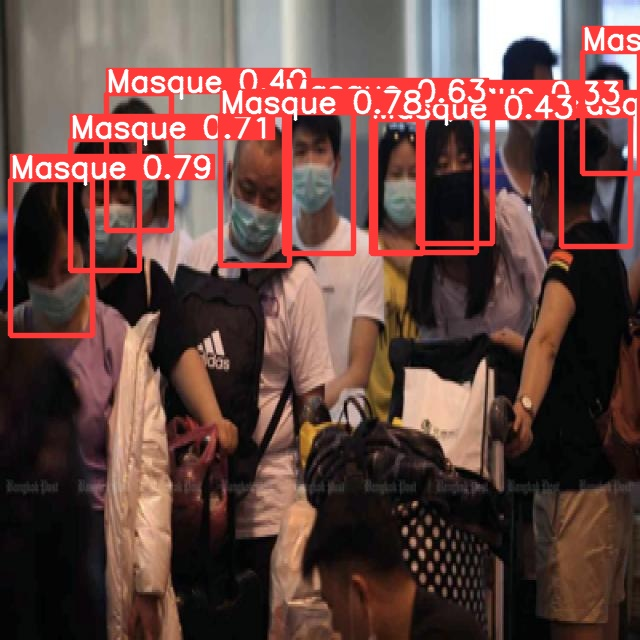

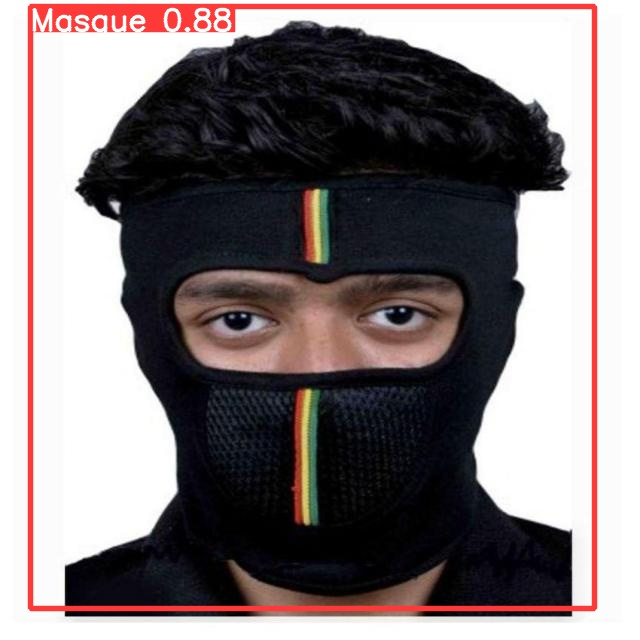

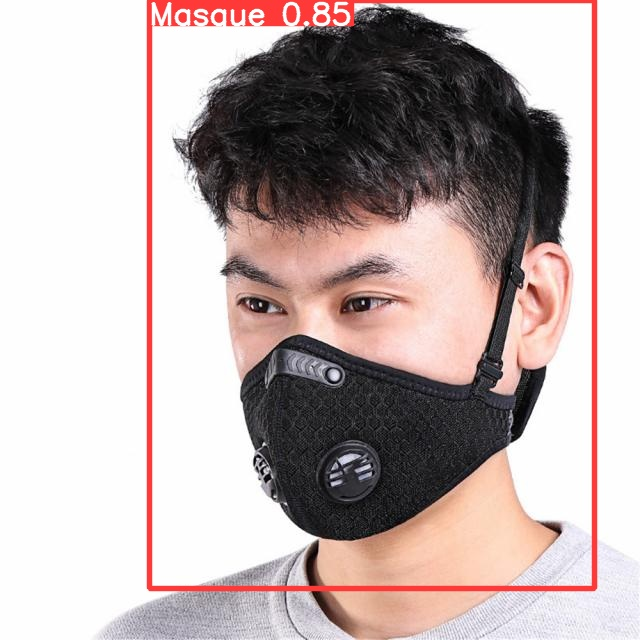

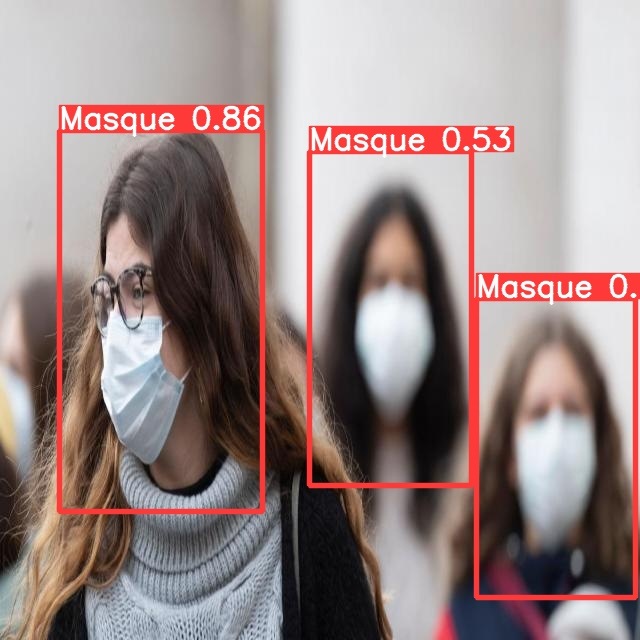

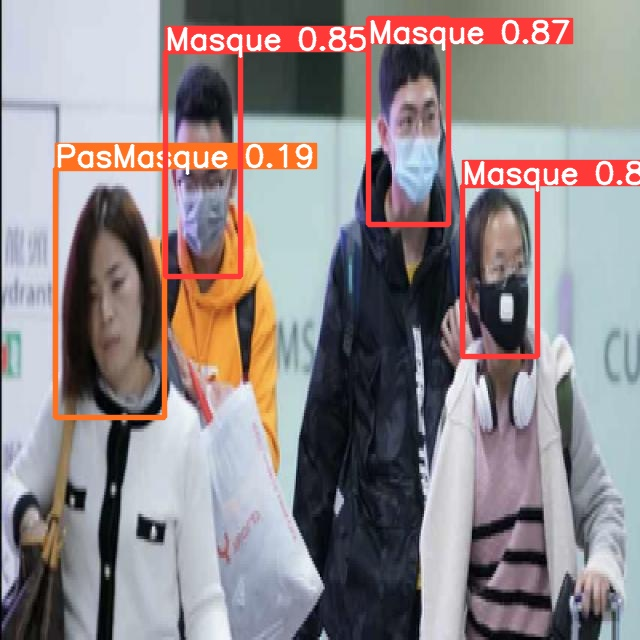

...

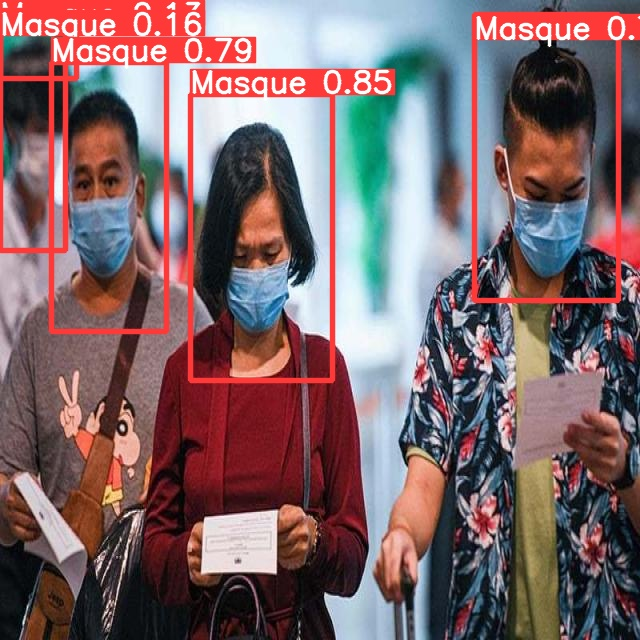

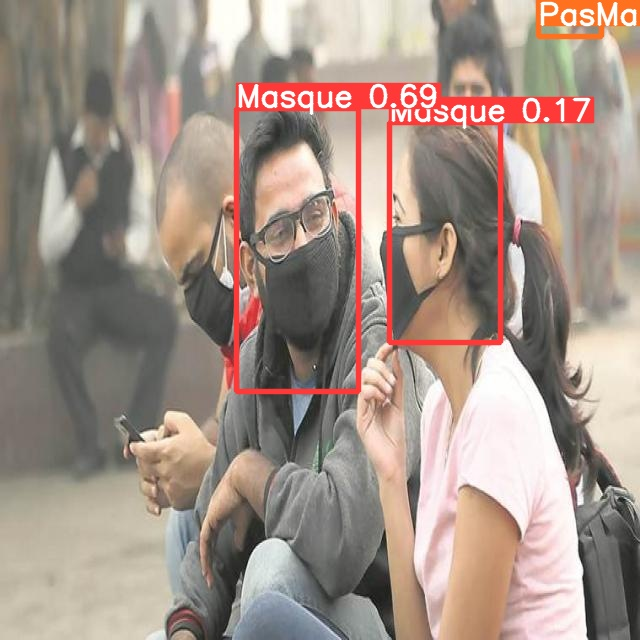

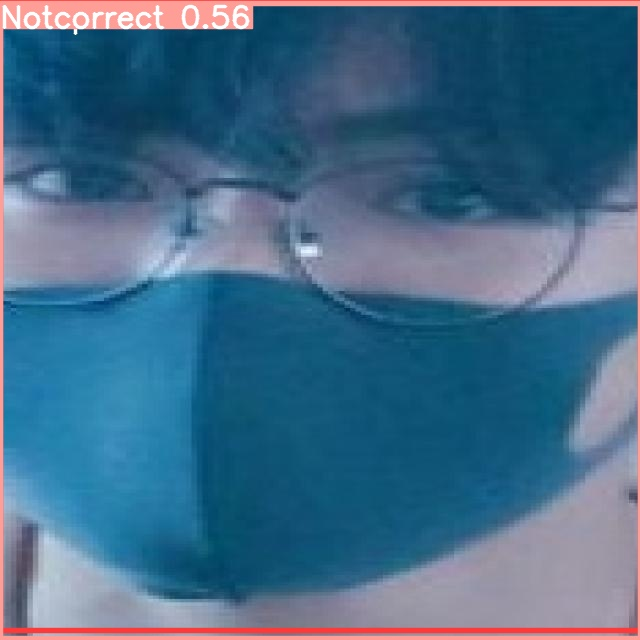

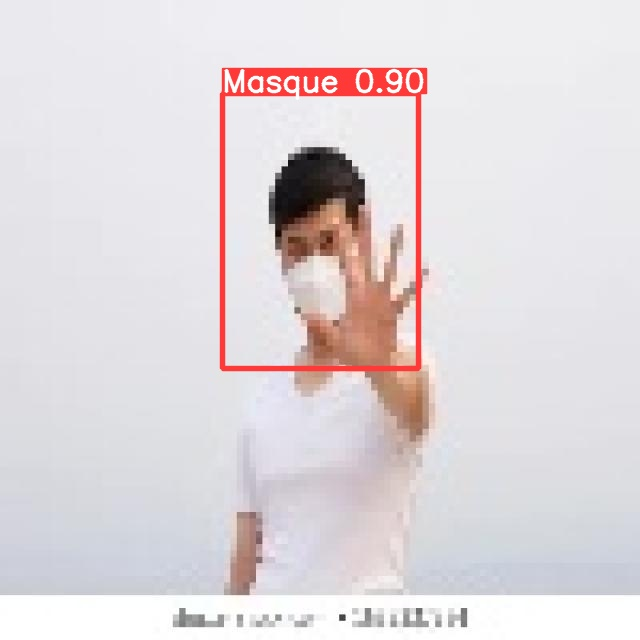

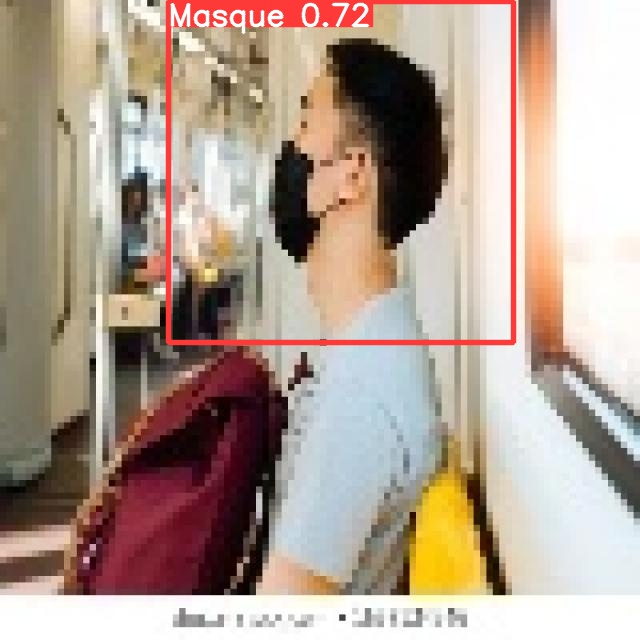

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/kaggle/working/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## DETECTION SUR LES IMAGES ET SUR LA VIDEO DE TEST DU PROJET

In [13]:
!python detect.py --weights /kaggle/working/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source /kaggle/input/projet-facemask-test/Projet_Face_Mask_test

detect: weights=['/kaggle/working/yolov5/runs/train/exp/weights/best.pt'], source=/kaggle/input/projet-facemask-test/Projet_Face_Mask_test, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-31-g443ef7f Python-3.7.12 torch-1.11.0 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/4 /kaggle/input/projet-facemask-test/Projet_Face_Mask_test/img1.jpeg: 288x416 4 Masques, 17.5ms
image 2/4 /kaggle/input/projet-facemask-test/Projet_Face_Mask_test/img2.jpeg: 416x416 1 Masque, 14.1ms
image 3/4 /kaggle/input/projet-facemask-test/Projet_Face_Mask_test/img3.jpeg: 320x416 1

## AFFICHAGE DES IMAGES ET DE LA VIDEO DE VALIDATION

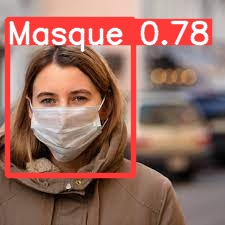

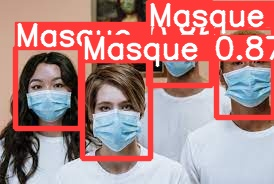

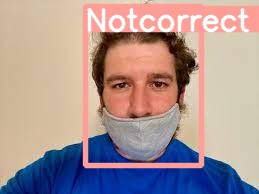

In [17]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/kaggle/working/yolov5/runs/detect/exp3/*.jpeg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from IPython.display import Video

Video("/kaggle/working/yolov5/runs/detect/exp3/vid.mp4",embed=True)

## Copier les fichiers outputs pour telechargement

In [20]:
!cp -r /kaggle/working/yolov5/runs/detect/exp3 /kaggle/working/

In [25]:
#import os
os.chdir(r'/kaggle/working')

In [26]:
!zip -r Outputs.zip exp3

  adding: exp3/ (stored 0%)
  adding: exp3/vid.mp4 (deflated 2%)
  adding: exp3/img2.jpeg (deflated 4%)
  adding: exp3/img1.jpeg (deflated 3%)
  adding: exp3/img3.jpeg (deflated 4%)


In [27]:
from IPython.display import FileLink

FileLink(r'Outputs.zip')

/kaggle/working/Outputs.zip